## Replicating S&P 500 and Dow Jones Industrial by Building Tracking Portfolios

Karthick Ramasubramanian - KR33733

Harsh Mehta - HDM564

Jonathan Jan - JJ39582


In [ ]:
# !pip install yfinance
import yfinance as yf
import fix_yahoo_finance
from pandas_datareader import data as pdr
import wrds

import pandas as pd 
from datetime import datetime
from google.colab import files
from scipy.optimize import nnls
import numpy as np
from pandas import DatetimeIndex

%pylab inline

## S&P 500

In [13]:
files.upload()

Saving Daily_Stock_Price_Close.xlsx to Daily_Stock_Price_Close (2).xlsx


{'Daily_Stock_Price_Close.xlsx': b'PK\x03\x04\x14\x00\x00\x00\x08\x00\xda%JS\x97\x8a\xbb\x1c\xc0\x00\x00\x00\x13\x02\x00\x00\x0b\x00\x00\x00_rels/.rels\x9d\x92\xb9n\xc30\x0c@\x7f\xc5\xd0\x9e0\x07\xd0!\x883e\xf1\x16\x04\xf9\x01V\xa2\x0f\xd8\x12\x05\x8aE\x9d\xbf\xaf\xda\xa5q\x90\x0b\x19y=<\x12\xdc\x1ei@\xed8\xa4\xb6\x8b\xa9\x18\xfd\x10RiZ\xd5\xb8\x01H\xb6%\x8fi\xce\x91B\xae\xd4,\x1e5\x87\xd2@D\xdbcC\xb0Z,>@.\x19f\xb7\xbdd\x16\xa7s\xa4W\x88\\\xd7\x9d\xa5=\xdb/OAo\x80\xaf:LqBiHK3\x0e\xf0\xcd\xd2\x7f2\xf7\xf3\x0c5E\xe5J#\x95[\x1ax\xd3\xe5\xfev\xe0I\xd1\xa1"X\x16\x9aE\xc9\xd3\xa2\x1d\xa5\x7f\x1d\xc7\xf6\x90\xd3\xe9\xafc"\xb4z[\xe8\xf9qhT\n\x8e\xdcc%\x8cqb\xb4\xfe5\x82\xc9\x0f\xec~\x00PK\x03\x04\x14\x00\x00\x00\x08\x00\xda%JS\'\xe8\x87\x0e\x82\x00\x00\x00\xb1\x00\x00\x00\x10\x00\x00\x00docProps/app.xmlM\x8eM\x0b\xc20\x10D\xffJ\xe9\xddn)\xe8Ab@\xb0G\xc1\x93\xf7\x90nl \xc9\x86\xcd\n\xf9\xf9\xa6\x82\x1f\xb7y\xbca\x18uc\xca\xc8\xe2\xb1t5\x86TN\xfd*\x92\x8f\x00\xc5\xae\x18M\x19\x9aN\xcd8\xe2h\xa4!

In [15]:
## Getting S&P 500 Return from WRDS Database

s_p_returns = pd.read_excel('S&P500 Monthly Return.xlsx')
s_p_returns['Calendar Date'] = pd.to_datetime(s_p_returns['Calendar Date'])
s_p_returns.set_index('Calendar Date', inplace=True)
# s_p_returns.head()

# Getting Quaterly returns on S&P
def quateronly(i):
  if i in (3,6,9,12):
    return True 
  else:
    return False   
s_p_returns_only = s_p_returns[s_p_returns.index.month.map(quateronly)][['Level of the S&P 500 Index']]

s_p_returns_only['Quaterly Change'] = s_p_returns_only.shift()
s_p_returns_only['Quaterly Return'] =  100 * (s_p_returns_only['Level of the S&P 500 Index'] - s_p_returns_only['Quaterly Change'])/s_p_returns_only['Quaterly Change']
s_p_returns_only['2010-12':].head()

,Level of the S&P 500 Index,Quaterly Change,Quaterly Return
Calendar Date,,,
2010-12-31,1257.64,1141.20,10.203295
2011-03-31,1325.83,1257.64,5.422060
2011-06-30,1320.64,1325.83,-0.391453
2011-09-30,1131.42,1320.64,-14.327902
2011-12-30,1257.60,1131.42,11.152357


In [10]:
## We are assuming no. of shares outstading in constant.  Market Cap & Latest Price is extracted below for top 100 companies
# Data is extracted from Yahoo Finance for the individual Tickers.

# We are only considering 100 biggest stock by market cap as of date and which have been trading since 2010.

mcap_price = pd.DataFrame( [['Karthick', 7,   7000000000] ]
    , columns=['ticker','latest_price', 'latest_mcap' ])

listoftickers = pd.read_excel('100biggest_companies_alwaysinS&P.xlsx')['100 Largest companies always present in S&P'].values

yahoo_scrap_error = []
for i in listoftickers:
  try:
    df = pd.DataFrame( [[i, float(yf.download(i, start='2021-10-08',end='2021-10-09')[['Adj Close']].values),   yf.Ticker(i).info['marketCap'] ]] ,columns=['ticker','latest_price', 'latest_mcap' ])
    print(df)
    mcap_price = pd.concat([mcap_price,df],axis=0)
  except:
    yahoo_scrap_error.append(i)


# mcap.set_index('ticker',inplace=True)

# yahoo_scrap_error

# mcap_price.to_excel('latest_market_price_cap.xlsx')
# files.download('latest_market_price_cap.xlsx')

latest_mcap_price = pd.read_excel('latest_market_price_cap.xlsx')
latest_mcap_price.set_index('ticker',inplace=True)
latest_mcap_price.drop(['Karthick'],inplace=True)

latest_mcap_price['shares_outstanding']= latest_mcap_price['latest_mcap']/latest_mcap_price['latest_price']


In [16]:
# Getting Quaterly Close price for the tickers.

# list_of_tickers = latest_mcap_price.index.values

def filter_date(s):
  if s in s_p_returns_only.index:
    return True
  else:
    return False


# daily_stock_close = yahooFinance.download([i for i in list_of_tickers], start = '2010-01-01', end='2021-01-01')['Adj Close']
# daily_stock_close.to_excel('Daily_Stock_Price_Close.xlsx')
# files.download('Daily_Stock_Price_Close.xlsx')

daily_stock_close = pd.read_excel('Daily_Stock_Price_Close.xlsx')

daily_stock_close['Date'] = pd.to_datetime(daily_stock_close['Date'])
daily_stock_close.set_index('Date', inplace = True)

quaterly_stock_close = daily_stock_close[daily_stock_close.index.map(filter_date)]
quaterly_stock_close.head()


,AAPL,ABT,ACN,ADBE,ADP,AMAT,AMD,AMGN,AMT,AMZN,ANTM,AVGO,BA,BAC,BKNG,BLK,BMY,C,CAT,CB,CHTR,CMCSA,COF,COP,COST,CRM,CSCO,CVS,CVX,DE,DHR,DIS,DUK,EL,FIS,GE,GILD,GOOG,GOOGL,GS,...,MDT,MMM,MO,MRK,MS,MSFT,MU,NEE,NFLX,NKE,NVDA,ORCL,PEP,PFE,PG,PLD,PM,PNC,QCOM,RTX,SBUX,SCHW,SHW,SPGI,SYK,TFC,TGT,TJX,TMO,TMUS,TSLA,TXN,UNH,UNP,UPS,USB,V,WFC,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-03-31,7.217045,19.414749,33.059921,35.369999,29.580254,10.828743,9.27,47.021969,35.558182,135.770004,54.545891,15.850481,56.530022,15.409756,255.000000,159.794785,18.457802,35.114204,45.108593,35.325970,34.500000,7.582361,34.713326,26.381781,44.654892,18.612499,19.193680,28.744040,47.965618,46.574429,19.635126,30.407646,28.890961,28.458059,19.991623,134.570343,18.727354,282.501129,283.843842,143.607620,...,34.797871,61.178844,10.935924,23.988672,22.287912,22.813797,10.37,8.052863,10.534286,13.603397,3.997149,21.968187,47.113972,10.588146,44.552711,18.929684,30.273855,45.000580,31.058010,35.205860,10.059675,16.090363,19.782373,28.527185,49.072884,22.955910,38.639442,8.242879,49.279579,11.514055,NaN,18.227531,27.236528,28.760361,45.864689,19.359060,20.935928,22.856867,42.184204,43.142174
2010-06-30,7.724693,17.385599,30.726620,26.430000,27.003359,9.716537,7.32,41.332825,37.135384,109.260002,41.455894,16.235954,49.137108,12.413537,176.539993,105.871140,17.462051,32.599861,43.382282,35.014252,35.299999,7.029868,33.822025,25.570261,41.146206,21.455000,15.713306,23.106504,43.325058,43.833725,18.251127,27.437429,28.731531,24.448395,22.916481,106.705200,14.118619,221.644226,222.697693,110.757317,...,28.155415,58.189579,10.867296,22.709118,17.690956,18.003220,8.49,8.208373,15.521429,12.689917,2.345454,18.371891,43.738316,8.896688,42.561039,16.476606,26.943293,42.655045,24.437941,31.226337,10.113835,12.246524,20.317411,22.705479,43.061268,18.730591,36.229679,8.240427,46.989956,13.319224,4.766,17.419874,23.797913,27.405186,40.790871,16.754366,16.295952,18.831139,36.683010,37.008732
2010-09-30,8.714196,19.595081,33.779404,26.150000,28.434189,9.501672,7.11,43.305168,42.776619,157.059998,47.988186,17.353815,52.421516,11.325540,348.339996,126.584633,19.201406,33.900394,57.200741,40.354332,32.500000,7.356608,33.233185,30.219746,48.571453,27.950001,16.148355,24.873442,52.230103,55.163387,19.976822,28.831081,32.248844,27.738590,23.223320,120.357376,14.666394,261.913300,263.158173,122.293732,...,26.230272,64.278008,13.236554,24.154440,18.846308,19.263401,7.21,9.241247,23.165714,15.283913,2.683144,23.035540,48.392284,10.831532,42.887001,18.614416,33.307159,39.253201,33.752144,34.474483,10.690019,12.052215,22.179199,26.901241,43.184456,17.240492,39.570148,8.890988,45.869102,17.010878,4.082,20.403938,29.529091,32.398331,48.164749,16.244287,17.132866,18.510977,41.080353,40.356266
2010-12-31,9.906085,18.119904,38.932491,30.780001,31.553646,11.493875,8.18,43.140160,43.093731,180.000000,48.174572,21.960577,51.724434,11.543572,399.549988,142.575104,18.755186,41.009926,68.466354,43.624996,38.939999,8.987330,35.807140,36.158363,54.561508,33.000000,14.916951,27.561111,59.306351,65.929977,23.213631,33.029694,32.867882,35.757595,23.488134,135.599396,14.925873,295.875977,297.282288,142.552185,...,29.165733,64.375275,13.774405,23.901541,20.821320,22.088404,8.02,8.919083,25.100000,16.524691,3.537707,26.902733,47.939842,11.160221,46.358677,22.740908,35.177429,46.001842,37.160145,38.319172,13.500065,14.892086,24.842203,29.827387,46.488586,18.942060,44.731735,8.957306,53.034943,20.539904,5.326,24.541979,30.470232,36.853924,52.778172,20.301382,16.270239,22.880640,41.623993,48.056816
2011-03-31,10.703029,18.723265,44.135262,33.160000,35.232380,12.833971,8.60,42.000755,43.243942,180.130005,59.347996,24.101973,58.936634,11.543205,506.440002,151.425003,19.191793,38.322182,81.780640,45.874355,50.630001,10.156196,43.758080,42.779160,55.552479,33.395000,12.690149,27.301519,70.386688,77.206596,25.551359,37.943199,33.954170,42.696423,28.078415,148.775604

In [17]:
## Getting Quaterly Returns for all the tickers.

quaterly_stock_returns = pd.DataFrame()

for i in quaterly_stock_close.columns.values:
  column_name = 'QuaterlyChange_' + i
  quaterly_stock_close[column_name] = quaterly_stock_close[i].shift()
  quaterly_stock_returns[i] =  100 * (quaterly_stock_close[i] - quaterly_stock_close[column_name])/quaterly_stock_close[column_name]

quaterly_stock_returns = quaterly_stock_returns['2010-12':'2020-12']
quaterly_stock_returns.head()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,AAPL,ABT,ACN,ADBE,ADP,AMAT,AMD,AMGN,AMT,AMZN,ANTM,AVGO,BA,BAC,BKNG,BLK,BMY,C,CAT,CB,CHTR,CMCSA,COF,COP,COST,CRM,CSCO,CVS,CVX,DE,DHR,DIS,DUK,EL,FIS,GE,GILD,GOOG,GOOGL,GS,...,MDT,MMM,MO,MRK,MS,MSFT,MU,NEE,NFLX,NKE,NVDA,ORCL,PEP,PFE,PG,PLD,PM,PNC,QCOM,RTX,SBUX,SCHW,SHW,SPGI,SYK,TFC,TGT,TJX,TMO,TMUS,TSLA,TXN,UNH,UNP,UPS,USB,V,WFC,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-12-31,13.677553,-7.528306,15.255117,17.705549,10.970797,20.966866,15.049229,-0.381037,0.741321,14.605885,0.388400,26.546105,-1.329764,1.925143,14.701152,12.632237,-2.323894,20.971825,19.694874,8.104865,19.815380,22.166772,7.745137,19.651448,12.332460,18.067975,-7.625571,10.805379,13.548218,19.517638,16.202821,14.562798,1.919565,28.909201,1.140295,12.663968,1.769205,12.967145,12.967150,16.565406,...,11.191119,0.151323,4.063372,-1.047009,10.479569,14.665129,11.234402,-3.486159,8.349780,8.118196,31.849285,16.787943,-0.934947,3.034553,8.094937,22.168257,5.615218,17.192590,10.097139,11.152273,26.286635,23.563067,12.006763,10.877363,7.651203,9.869606,13.044143,0.745896,15.622368,20.745702,30.475270,20.280597,3.187166,13.752539,9.578421,24.975516,-5.034925,23.605795,1.323358,19.081424
2011-03-31,8.044991,3.329825,13.363569,7.732291,11.658665,11.659223,5.134475,-2.641168,0.348569,0.072225,23.193613,9.751090,13.943507,-0.003181,26.752601,6.207184,2.327929,-6.553887,19.446464,5.156125,30.020552,13.005700,22.204899,18.310553,1.816245,1.196971,-14.927996,-0.941878,18.683223,17.103933,10.070499,14.876025,3.305015,19.405185,19.542976,9.717011,17.190909,-1.213861,-1.213867,-5.484699,...,6.740616,8.994564,7.317556,-7.337041,0.577619,-8.491303,43.017452,7.108673,35.332949,-10.117280,19.870090,6.976663,-0.653808,17.210515,-3.533888,14.384919,13.282276,3.906848,11.152700,8.073814,15.462292,5.710114,0.723968,8.912856,13.558285,4.999167,-16.446157,13.396255,0.343204,28.582738,4.205782,6.742773,25.533332,6.556699,3.116278,-1.544199,4.814420,2.705150,-2.809536,15.663775
2011-06-30,-3.684258,8.296936,10.807453,-5.156813,3.372363,-16.217977,-18.720936,9.167397,0.984189,13.523566,13.238745,22.508662,0.528107,-17.709408,1.084036,-3.914936,10.851491,-5.768585,-3.993385,2.902969,7.169657,2.969677,-0.468245,-4.986437,11.126285,11.528667,-8.979591,9.885007,-3.586158,-14.468889,2.138655,-9.398947,5.068003,9.163554,-5.661898,-5.839136,-2.495877,-13.698961,-13.698960,-15.868408,...,-1.519345,2.041800,2.907676,8.065380,-15.612742,3.073726,-34.786401,5.244169,10.476069,20.685656,-13.651115,-1.379074,10.143959,2.409762,4.053923,0.428007,2.688366,-4.833356,3.971683,5.134593,7.255812,-8.458731,0.284768,7.002382,-3.169576,-1.648975,-5.741364,7.162466,15.913587,5.972904,4.972973,-4.660530,14.492905,6.667020,-1.181919,-2.987344,14.666007,-11.149270,2.769640,-2.720118
2011-09-30,13.599693,-1.929302,-12.810313,-23.147855,-9.821159,-19.788721,-27.324748,-5.295876,2.809095,5.741107,-16.789727,-13.502879,-17.597142,-44.091745,-12.202841,-22.194463,8.356345,-38.456552,-30.347640,-6.822726,-13.674896,-17.073009,-23.207657,-15.040123,1.416520,-23.291716,-0.327584,-10.315323,-9.245639,-21.221001,-20.808241,-22.745899,7.667511,-16.493980,-20.858447,-19.204178,-6.302858,1.710177,1.710179,-28.742964,...,-13.173731,-23.801803,3.107405,-6.225596,-41.161324,-3.665042,-32.620322,-5.039213,-56.880732,-3.588053,-21.518184,-12.516262,-11.404159,-13.217986,0.200698,-31.617278,-5.454115,-18.667131,-13.983976,-19.976700,-5.235542,-31.161058,-10.952066,-1.535058,-19.401623,-20.057609,5.192366,7.201544,-21.354250,-49.389890,-16.271891,-18.475513,-10.275531,-21.354863,-12.712650,-7.240757,1.910808,-13.660136,-1.626901,-10.162651
2011-12-30,6.209995,10.963758,2.254514,16.963179,15.423800,4.120073,6.299216,17.403841,12.204980,-19.946349,1.859236,-11.561994,21.992586,-8.971117,4.060428,21.806934,13.444651,2.727627,23.376893,16.376414,21.562764,14.494995,6.839034,16.212543,1.739052,-11.218061,17.107698,21.838411,15.823711,20.421907,12.219053,26.424831,11.401759,29.090248,9.551

In [18]:
## Getting Quaterly MarketCap for all the tickers 

quaterly_stock_mcap = pd.DataFrame()
latest_mcap_price['shares_outstanding']= latest_mcap_price['latest_mcap']/latest_mcap_price['latest_price']

for i in latest_mcap_price.index.values:
  quaterly_stock_mcap[i] = latest_mcap_price.loc[i]['shares_outstanding']*quaterly_stock_close[i]

quaterly_stock_mcap = quaterly_stock_mcap['2010-12':'2020-12']

quaterly_stock_mcap.head()

,AAPL,MSFT,GOOGL,GOOG,AMZN,GE,TSLA,JPM,V,JNJ,WMT,UNH,BAC,HD,PG,DIS,NFLX,ADBE,ORCL,XOM,CMCSA,CRM,NKE,PFE,KO,CSCO,TMO,LLY,INTC,PEP,DHR,ABT,CVX,ACN,MRK,AVGO,COST,WFC,MS,MCD,...,GS,CHTR,BA,SBUX,NVDA,BMY,BLK,IBM,AMD,AMGN,AMT,AMAT,TGT,EL,CVS,DE,CAT,SPGI,MMM,BKNG,COP,SYK,LMT,PLD,ANTM,USB,ADP,MO,PNC,GILD,MDLZ,CB,TFC,MU,LRCX,TJX,DUK,SHW,COF,FIS
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-12-31,1.637496e+11,1.659919e+11,1.983985e+11,1.970789e+11,9.115938e+10,1.488420e+11,5.335427e+09,9.362798e+10,3.570325e+10,1.192020e+11,1.160685e+11,2.873090e+10,9.713801e+10,2.893405e+10,1.125737e+11,6.001925e+10,1.110916e+10,1.464512e+10,7.354373e+10,2.034514e+11,4.124951e+10,3.230700e+10,2.615561e+10,6.257190e+10,9.737992e+10,6.291582e+10,2.086495e+10,2.402220e+10,6.222951e+10,6.628402e+10,1.657221e+10,3.212333e+10,1.146931e+11,2.462761e+10,6.050364e+10,9.039325e+09,2.410658e+10,9.395729e+10,3.798975e+10,4.177623e+10,...,4.805391e+10,7.158029e+09,3.031838e+10,1.591793e+10,8.815965e+09,4.167609e+10,2.169936e+10,7.346069e+10,9.922095e+09,2.449723e+10,1.959455e+10,1.050518e+10,2.212986e+10,1.296256e+10,3.628613e+10,2.056633e+10,3.750498e+10,7.185418e+09,3.731674e+10,1.640265e+10,4.879282e+10,1.752113e+10,1.365928e+10,1.682311e+10,1.179511e+10,3.039117e+10,1.342664e+10,2.561075e+10,1.954425e+10,1.871973e+10,2.349973e+10,1.961777e+10,2.547423e+10,8.993789e+09,6.599977e+09,1.080690e+10,2.528253e+10,6.606784e+09,1.616653e+10,1.461244e+10
2011-03-31,1.769232e+11,1.518970e+11,1.959902e+11,1.946866e+11,9.122522e+10,1.633050e+11,5.559823e+09,1.018672e+11,3.742215e+10,1.152238e+11,1.128075e+11,3.606686e+10,9.713492e+10,3.079340e+10,1.085955e+11,6.894772e+10,1.503435e+10,1.577753e+10,7.867463e+10,2.353196e+11,4.661430e+10,3.269371e+10,2.350937e+10,7.334084e+10,9.965867e+10,5.352375e+10,2.093656e+10,2.444763e+10,6.021984e+10,6.585065e+10,1.824112e+10,3.319298e+10,1.361215e+11,2.791873e+10,5.606446e+10,9.920758e+09,2.454442e+10,9.649897e+10,3.820918e+10,4.175020e+10,...,4.541830e+10,9.306908e+09,3.454583e+10,1.837920e+10,1.056771e+10,4.264628e+10,2.304628e+10,8.194783e+10,1.043154e+10,2.385021e+10,1.966285e+10,1.173001e+10,1.849035e+10,1.547797e+10,3.594436e+10,2.408398e+10,4.479837e+10,7.825844e+09,4.067322e+10,2.079078e+10,5.772705e+10,1.989669e+10,1.585711e+10,1.924310e+10,1.453082e+10,2.992187e+10,1.499201e+10,2.748483e+10,2.030781e+10,2.193782e+10,2.360540e+10,2.062929e+10,2.674773e+10,1.286269e+10,7.221988e+09,1.225462e+10,2.611812e+10,6.654615e+09,1.975629e+10,1.746814e+10
2011-06-30,1.704049e+11,1.565659e+11,1.691416e+11,1.680166e+11,1.035621e+11,1.537694e+11,5.836312e+09,9.095574e+10,4.291049e+10,1.304837e+11,1.159319e+11,4.129399e+10,7.993290e+10,3.032165e+10,1.129978e+11,6.246736e+10,1.660936e+10,1.496391e+10,7.758965e+10,2.289186e+11,4.799859e+10,3.646285e+10,2.837244e+10,7.510818e+10,1.025601e+11,4.871754e+10,2.426832e+10,2.642251e+10,6.664772e+10,7.253052e+10,1.863123e+10,3.594698e+10,1.312400e+11,3.093604e+10,6.058628e+10,1.215379e+10,2.727530e+10,8.574004e+10,3.224368e+10,4.661091e+10,...,3.821114e+10,9.974182e+09,3.472826e+10,1.971276e+10,9.125096e+09,4.727403e+10,2.214403e+10,8.659485e+10,8.478660e+09,2.603666e+10,1.985637e+10,9.827636e+09,1.742875e+10,1.689630e+10,3.949746e+10,2.059930e+10,4.300940e+10,8.373839e+09,4.150368e+10,2.101616e+10,5.484853e+10,1.926605e+10,1.612510e+10,1.932546e+10,1.645452e+10,2.902800e+10,1.549760e+10,2.828400e+10,1.932627e+10,2.139028e+10,2.674323e+10,2.122815e+10,2.630667e+10,8.388222e+09,5.644010e+09,1.313235e+10,2.744179e+10,6.673565e+09,1.966378e+10,1.647911e+10
2011-09-30,1.935794e+11,1.508277e+11,1.720342e+11,1.708899e+11,1.095077e+11,1.242393e+11,4.886634e+09,6.732827e+10,4.373043e+10,1.260456e+11,1.140458e+11,3.705081e+10,4.468909e+10,2.772108e+10,1.132246e+11,4.825860e+10,7.161836e+09,1.150009e+10,6.787833e+10,2.056544e+11,3.980379e+10,2.797003e+10,2.735442e+10,6.518039e+10,1.043859e+11,4.855795e+10,1.908600e+10,2.640336e+10,6.480812e+10,6.425902e+10,1.475440e+

In [19]:
# Building the Tracking Portfolio Algorithm

portfolio_weight = pd.DataFrame(columns=quaterly_stock_mcap.columns.values, index=quaterly_stock_mcap.index).fillna(0.00)
# pd.to_numeric(portfolio_weight)

number_of_stocks = 40  

list_of_stocks_for_year = pd.DataFrame() #only works when dataframe is arranged with time (Increasing Order). 

for i in quaterly_stock_mcap.index:

  if i.month == 12:
    # Reconstitute
    weights = quaterly_stock_mcap.loc[i].sort_values(ascending=False)[:number_of_stocks]/sum(quaterly_stock_mcap.loc[i].sort_values(ascending=False)[:number_of_stocks])  
    
    for j in weights.index:
      portfolio_weight.loc[i][j] = weights.loc[j]
    
    list_of_stocks_for_year = pd.DataFrame(data=[[0]]  ,index=weights.index,columns=['Market Cap'],dtype=float)
    # list_of_stocks_for_year.set_index(weights.index,inplace=True)

  else:
    # Rebalance
    for j in list_of_stocks_for_year.index:
      # Getting the current market cap
      list_of_stocks_for_year.loc[j] = quaterly_stock_mcap[j].loc[i]
      # print(list_of_stocks_for_year)
      # print('------------------------')

    weights2 = list_of_stocks_for_year/sum(list_of_stocks_for_year)

    for k in weights2.index:
        portfolio_weight.loc[i][k] = weights2.loc[k]



In [22]:
# Portfolio Return every quater

portfolio_return = pd.DataFrame(index=portfolio_weight.index,columns=['return'])

for i in portfolio_weight.index:
  portfolio_return.loc[i] = sum(portfolio_weight.loc[i] * quaterly_stock_returns.loc[i])

# portfolio_return.reset_index(inplace=True)
# portfolio_return['Date2'] = portfolio_return['Date'].shift(1)
# portfolio_return.set_index('Date2',inplace=True)
# portfolio_return = portfolio_return[['return']]
# portfolio_return.head()

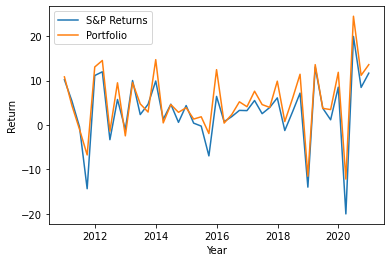

In [23]:
# Plotting

plot(s_p_returns_only['2010-12':].index, s_p_returns_only['2010-12':]['Quaterly Return'], marker='None', linestyle='-', label='S&P Returns')
plot(portfolio_return.index, portfolio_return, marker='None', linestyle='-', label='Portfolio')
# plot(vanguard_etf_returns.index, vanguard_etf_returns['Quaterly Return'], marker='None', linestyle='-', label='Vanguard ETF')
# plot(vanguard_mf_returns.index, vanguard_mf_returns['Quaterly Return'], marker='None', linestyle='-', label='Vanguard MF')
xlabel('Year')
ylabel('Return')
legend(loc='best')
show()

In [25]:
# s&p Index fund - ETF
# vanguard_etf_returns = yf.download('VOO',start='2010-12-31',end='2021-12-31')[['Adj Close']]

vanguard_etf_returns = vanguard_etf_returns[vanguard_etf_returns.index.map(filter_date)]

vanguard_etf_returns['Previous_quarter'] = vanguard_etf_returns['Adj Close'].shift()
vanguard_etf_returns['Quaterly Return'] = 100 * (vanguard_etf_returns['Adj Close'] - vanguard_etf_returns['Previous_quarter'])/vanguard_etf_returns['Previous_quarter']

vanguard_etf_returns.head()



[*********************100%***********************]  1 of 1 completed


,Adj Close,Previous_quarter,Quaterly Return
Date,,,
2010-12-31,93.716881,NaN,NaN
2011-03-31,99.123756,93.716881,5.769372
2011-06-30,99.145416,99.123756,0.021851
2011-09-30,85.525475,99.145416,-13.737339
2011-12-30,95.495117,85.525475,11.656928


In [27]:
# S&P Index fund - Mutual Fund

# vanguard_mf_returns = yf.download('VFINX',start='2010-12-31',end='2021-12-31')[['Adj Close']]

vanguard_mf_returns = vanguard_mf_returns[vanguard_mf_returns.index.map(filter_date)]

vanguard_mf_returns['Previous_quarter'] = vanguard_mf_returns['Adj Close'].shift()
vanguard_mf_returns['Quaterly Return'] = 100 * (vanguard_mf_returns['Adj Close'] - vanguard_mf_returns['Previous_quarter'])/vanguard_mf_returns['Previous_quarter']

vanguard_mf_returns.head()


[*********************100%***********************]  1 of 1 completed


,Adj Close,Previous_quarter,Quaterly Return
Date,,,
2010-12-31,95.246712,NaN,NaN
2011-03-31,100.852135,95.246712,5.885162
2011-06-30,100.918297,100.852135,0.065603
2011-09-30,86.871338,100.918297,-13.919140
2011-12-30,97.109993,86.871338,11.785999


In [28]:
df = s_p_returns_only['2011-03':][['Quaterly Return']]
df['Portfolio Return'] = pd.to_numeric(portfolio_return['2011-03':]['return'])
df['Vanguard ETF Return'] = vanguard_etf_returns['Quaterly Return']
df['Vanguard MF Return'] = vanguard_mf_returns['Quaterly Return']
df.head()

,Quaterly Return,Portfolio Return,Vanguard ETF Return,Vanguard MF Return
Calendar Date,,,,
2011-03-31,5.422060,4.406512,5.769372,5.885162
2011-06-30,-0.391453,-0.945633,0.021851,0.065603
2011-09-30,-14.327902,-6.723158,-13.737339,-13.919140
2011-12-30,11.152357,13.076938,11.656928,11.785999
2012-03-30,11.996660,14.539201,12.545004,12.540774


In [29]:
df['Tracking Error Portfolio'] = df['Quaterly Return'] - df['Portfolio Return']
df['Tracking Error vanguard_ETF'] = df['Quaterly Return'] - df['Vanguard ETF Return']
df['Tracking Error Vanguard_MF'] = df['Quaterly Return'] - df['Vanguard MF Return']

print('Portfolio Tracking error ', std(df['Tracking Error Portfolio']))
print('Vanguard_ETF Tracking error ', std(df['Tracking Error vanguard_ETF']))
print('Vanguard_MF Tracking error ', std(df['Tracking Error Vanguard_MF']))

Portfolio Tracking error  2.2731182961506984
Vanguard_ETF Tracking error  0.13768313686945619
Vanguard_MF Tracking error  0.05278481169176069


# DOW JONES INDUSTRIAL AVERAGE

In [32]:
files.upload()

Saving Yearwise_Stocks.xlsx to Yearwise_Stocks.xlsx


{'Yearwise_Stocks.xlsx': b'PK\x03\x04\x14\x00\x00\x00\x08\x00\xb4\x08KS\x97\x8a\xbb\x1c\xc0\x00\x00\x00\x13\x02\x00\x00\x0b\x00\x00\x00_rels/.rels\x9d\x92\xb9n\xc30\x0c@\x7f\xc5\xd0\x9e0\x07\xd0!\x883e\xf1\x16\x04\xf9\x01V\xa2\x0f\xd8\x12\x05\x8aE\x9d\xbf\xaf\xda\xa5q\x90\x0b\x19y=<\x12\xdc\x1ei@\xed8\xa4\xb6\x8b\xa9\x18\xfd\x10RiZ\xd5\xb8\x01H\xb6%\x8fi\xce\x91B\xae\xd4,\x1e5\x87\xd2@D\xdbcC\xb0Z,>@.\x19f\xb7\xbdd\x16\xa7s\xa4W\x88\\\xd7\x9d\xa5=\xdb/OAo\x80\xaf:LqBiHK3\x0e\xf0\xcd\xd2\x7f2\xf7\xf3\x0c5E\xe5J#\x95[\x1ax\xd3\xe5\xfev\xe0I\xd1\xa1"X\x16\x9aE\xc9\xd3\xa2\x1d\xa5\x7f\x1d\xc7\xf6\x90\xd3\xe9\xafc"\xb4z[\xe8\xf9qhT\n\x8e\xdcc%\x8cqb\xb4\xfe5\x82\xc9\x0f\xec~\x00PK\x03\x04\x14\x00\x00\x00\x08\x00\xb4\x08KS\'\xe8\x87\x0e\x82\x00\x00\x00\xb1\x00\x00\x00\x10\x00\x00\x00docProps/app.xmlM\x8eM\x0b\xc20\x10D\xffJ\xe9\xddn)\xe8Ab@\xb0G\xc1\x93\xf7\x90nl \xc9\x86\xcd\n\xf9\xf9\xa6\x82\x1f\xb7y\xbca\x18uc\xca\xc8\xe2\xb1t5\x86TN\xfd*\x92\x8f\x00\xc5\xae\x18M\x19\x9aN\xcd8\xe2h\xa4!?\

In [36]:
dow_stocks_yearwise = pd.read_excel('Yearwise_Stocks.xlsx')
dow_stocks_yearwise = dow_stocks_yearwise[[2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]]
dow_stocks_yearwise.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,CAT,CAT,CAT,CAT,CAT,CAT,CAT,CAT,CAT,CAT,CAT
1,JPM,JPM,JPM,JPM,JPM,JPM,JPM,JPM,JPM,JPM,JPM
2,DIS,DIS,DIS,DIS,DIS,DIS,DIS,DIS,DIS,DIS,DIS
3,TRV,TRV,TRV,TRV,TRV,TRV,TRV,TRV,TRV,TRV,TRV
4,HPQ,HPQ,HPQ,HPQ,V,V,V,V,V,V,V


In [37]:
Dow_stocks = ['CAT','JPM','DIS','TRV','HPQ','JNJ','WMT','MSFT','INTC','HD','T','MDLZ','PFE','VZ','CVX','BAC','CSCO','AA','DOW','GE','RTX','MMM','AXP','BA','KO','IBM','MCD','MRK','PG','CRM','V','AAPL','UNH','NKE','GS','AMGN','HON','WBA']

index_filter = DatetimeIndex(['2009-12-31', '2010-03-31', '2010-06-30', '2010-09-30', \
               '2010-12-31', '2011-03-31', '2011-06-30', '2011-09-30',
               '2011-12-30', '2012-03-30', '2012-06-29', '2012-09-28',
               '2012-12-31', '2013-03-28', '2013-06-28', '2013-09-30',
               '2013-12-31', '2014-03-31', '2014-06-30', '2014-09-30',
               '2014-12-31', '2015-03-31', '2015-06-30', '2015-09-30',
               '2015-12-31', '2016-03-31', '2016-06-30', '2016-09-30',
               '2016-12-30', '2017-03-31', '2017-06-30', '2017-09-29',
               '2017-12-29', '2018-03-29', '2018-06-29', '2018-09-28',
               '2018-12-31', '2019-03-29', '2019-06-28', '2019-09-30',
               '2019-12-31', '2020-03-31', '2020-06-30', '2020-09-30',
               '2020-12-31'],
              dtype='datetime64[ns]', name='Calendar Date', freq=None)

def filter_date(s):
  if s in index_filter:
    return True
  else:
    return False


In [38]:
# Getting Stock Price and Returns for all stocks in Dow.

# dow_stock_price = yf.download(Dow_stocks,  start = '2010-12-31', end = '2021-01-01')['Adj Close']
# dow_stock_price.head()

dow_stock_price = dow_stock_price[dow_stock_price.index.map(filter_date)]
dow_stock_price = dow_stock_price[Dow_stocks]

dow_stock_returns = dow_stock_price.pct_change()

dow_stock_returns.head()

[*********************100%***********************]  38 of 38 completed


,CAT,JPM,DIS,TRV,HPQ,JNJ,WMT,MSFT,INTC,HD,T,MDLZ,PFE,VZ,CVX,BAC,CSCO,AA,DOW,GE,RTX,MMM,AXP,BA,KO,IBM,MCD,MRK,PG,CRM,V,AAPL,UNH,NKE,GS,AMGN,HON,WBA
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-03-31,0.194465,0.088000,0.148760,0.074231,-0.024972,-0.033373,-0.028095,-0.084914,-0.032295,0.064262,0.057026,0.004496,0.172105,0.091275,0.186832,-0.000032,-0.149280,0.149490,NaN,0.103814,0.080738,0.089946,0.057453,0.139435,0.015980,0.115534,-0.000623,-0.073370,-0.035339,0.011970,0.048144,0.080450,0.255333,-0.110670,-0.054847,-0.026412,0.129771,0.034563
2011-06-30,-0.039934,-0.107114,-0.093989,-0.011877,-0.108510,0.132438,0.027696,0.030738,0.106741,-0.015320,0.040712,0.132929,0.024098,-0.021550,-0.035862,-0.177094,-0.089796,-0.100343,NaN,-0.051616,0.051346,0.020418,0.152520,0.005281,0.021664,0.056707,0.116423,0.080654,0.040539,0.115287,0.146660,-0.036843,0.144929,0.193142,-0.158684,0.091674,0.003657,0.061993
2011-09-30,-0.303476,-0.259769,-0.227459,-0.158184,-0.379957,-0.034014,-0.016269,-0.036650,-0.027602,-0.085766,-0.079495,-0.038855,-0.132180,0.001371,-0.092456,-0.440917,-0.003276,-0.395314,NaN,-0.185261,-0.199767,-0.238018,-0.131528,-0.175971,0.010860,0.023791,0.048554,-0.062256,0.002007,-0.232917,0.019109,0.135997,-0.102755,-0.046265,-0.287430,-0.052959,-0.257762,-0.220683
2011-12-30,0.233770,0.113635,0.264248,0.223303,0.152395,0.039231,0.158640,0.050843,0.146458,0.289000,0.076662,0.121191,0.236302,0.105401,0.158237,-0.089711,0.171077,-0.093519,NaN,0.188159,0.045123,0.146504,0.054929,0.219926,0.043195,0.055751,0.151044,0.166744,0.064480,-0.112181,0.187169,0.062100,0.102599,0.131237,-0.039873,0.174038,0.246245,0.012030


In [39]:
# Getting Dow Index Price and Returns

#dow_price = yf.download(['^DJI'],  start = '2010-12-31', end = '2021-06-01')[['Adj Close']]
# dow_price.head()

dow_price = dow_price[dow_price.index.map(filter_date)]

dow_return = dow_price.pct_change()
dow_return.head()

[*********************100%***********************]  1 of 1 completed


,Adj Close
Date,
2010-12-31,NaN
2011-03-31,0.064109
2011-06-30,0.007680
2011-09-30,-0.120905
2011-12-30,0.119503


In [40]:
# Accounting for the change in ticker name
dow_stocks_yearwise.loc[20]='RTX'
dow_stocks_yearwise.head()

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,CAT,CAT,CAT,CAT,CAT,CAT,CAT,CAT,CAT,CAT,CAT
1,JPM,JPM,JPM,JPM,JPM,JPM,JPM,JPM,JPM,JPM,JPM
2,DIS,DIS,DIS,DIS,DIS,DIS,DIS,DIS,DIS,DIS,DIS
3,TRV,TRV,TRV,TRV,TRV,TRV,TRV,TRV,TRV,TRV,TRV
4,HPQ,HPQ,HPQ,HPQ,V,V,V,V,V,V,V


In [41]:
# Portfolio Weight: 1 if the stock in present in Dow for the index year.

portfolio_weight = pd.DataFrame(index = index_filter, columns = Dow_stocks).fillna(0.00)
portfolio_weight = portfolio_weight['2010-12':]


for quarters in portfolio_weight.index:
  current_dow_stocks = dow_stocks_yearwise[quarters.year]

  for stocks in current_dow_stocks:
    portfolio_weight.loc[quarters][stocks] = 1 



## Portfolio Returns

portfolio_return = pd.DataFrame(index = dow_stock_returns.index,columns=['portfolio return'])

i = 0

for return_dates in dow_stock_returns.index[1:]:
  i+=1
  portfolio_return.loc[return_dates]['portfolio return'] =  sum(portfolio_weight.iloc[i] * dow_stock_returns.loc[return_dates])/30

portfolio_return.head()


,portfolio return
Date,
2010-12-31,NaN
2011-03-31,0.0461173
2011-06-30,0.0101061
2011-09-30,-0.128359
2011-12-30,0.112695


In [44]:
# DOW Index fund - ETF
# spdr_etf_returns = yf.download('DIA',start='2010-12-31',end='2021-12-31')[['Adj Close']]

spdr_etf_returns = spdr_etf_returns[spdr_etf_returns.index.map(filter_date)]
spdr_etf_returns['Quaterly Return'] = spdr_etf_returns.pct_change()

spdr_etf_returns.head()

,Adj Close,Quaterly Return
Date,,
2010-12-31,90.810112,NaN
2011-03-31,97.154587,0.069865
2011-06-30,98.377831,0.012591
2011-09-30,87.109550,-0.114541
2011-12-30,98.128708,0.126498


In [45]:
df = dow_return
df['Portfolio Return'] = portfolio_return
df['Tracking Error Portfolio'] = df['Portfolio Return'] - df['Adj Close']

df['SPDR ETF Return'] = spdr_etf_returns['Quaterly Return']
df['Tracking Error ETF'] = df['SPDR ETF Return'] - df['Adj Close']

print('Portfolio Tracking Error ',  std(df['Tracking Error Portfolio'])*100)
print('SPDR_ETF Tracking Error', std(df['Tracking Error ETF'])*100)

Portfolio Tracking Error  1.4773655171101954
SPDR_ETF Tracking Error 0.09103671790845107


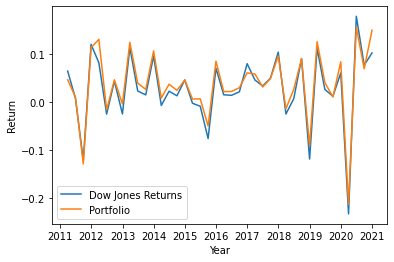

In [48]:
# Plotting

plot(df['2010-12':'2021-01'].index, df['2010-12':'2021-01']['Adj Close'], marker='None', linestyle='-', label='Dow Jones Returns')
plot(df['2010-12':'2021-01'].index, df['2010-12':'2021-01']['Portfolio Return'], marker='None', linestyle='-', label='Portfolio')
xlabel('Year')
ylabel('Return')
legend(loc='best')
show()